In [1]:
import numpy as np
import lasagne
import theano
import theano.tensor as T
from lasagne.nonlinearities import rectify, sigmoid, linear, tanh
from lasagne.layers import InputLayer, DenseLayer, BatchNormLayer, Upscale2DLayer, NonlinearityLayer, ReshapeLayer
from lasagne.layers import Conv2DLayer, MaxPool2DLayer, dropout

import matplotlib.pyplot as plt
%matplotlib inline

np.random.seed(42)

second_dim = 1
img_size = 160

input_image_left  = T.tensor4('input_left')
input_image_positive = T.tensor4('input_positive')
input_image_negative = T.tensor4('input_negative')

l_input = InputLayer(shape=(None, second_dim, img_size, img_size), input_var=input_image_left)
p_input = InputLayer(shape=(None, second_dim, img_size, img_size), input_var=input_image_positive)
n_input = InputLayer(shape=(None, second_dim, img_size, img_size), input_var=input_image_negative)

conv1_filter_size = 3
conv1_num_filters = 64
conv1_pad = 1
conv1_stride = 1

conv2_filter_size = 3
conv2_num_filters = 128
conv2_pad = 1
conv2_stride = 1

conv3_filter_size = 3
conv3_num_filters = 256
conv3_stride = 1
conv3_pad = 1

conv4_filter_size = 3
conv4_num_filters = 512
conv4_stride = 1
conv4_pad = 1

conv5_filter_size = 3
conv5_num_filters = 512
conv5_stride = 1
conv5_pad = 1

pool1_size = 2
pool2_size = 2
pool3_size = 2
pool4_size = 2
pool5_size = 2

dense_layer1_size = 1024
dense_layer2_size = 512

my_nonlin = rectify
net = Conv2DLayer(l_input, conv1_num_filters, conv1_filter_size, pad=conv1_pad, stride=conv1_stride,
                  nonlinearity=my_nonlin,
                  W=lasagne.init.GlorotUniform())
net = MaxPool2DLayer(net, pool1_size)
net = Conv2DLayer(net, conv2_num_filters, conv2_filter_size, pad=conv2_pad, stride=conv2_stride,
                  nonlinearity=my_nonlin)
net = MaxPool2DLayer(net, pool2_size)
net = Conv2DLayer(net, conv3_num_filters, conv3_filter_size, pad=conv3_pad, stride=conv3_stride,
                  nonlinearity=my_nonlin)
net = MaxPool2DLayer(net, pool3_size)
net = Conv2DLayer(net, conv4_num_filters, conv4_filter_size, pad=conv4_pad, stride=conv4_stride,
                  nonlinearity=my_nonlin)
net = MaxPool2DLayer(net, pool4_size)
net = Conv2DLayer(net, conv5_num_filters, conv5_filter_size, pad=conv5_pad, stride=conv5_stride,
                  nonlinearity=my_nonlin)
net = MaxPool2DLayer(net, pool5_size)
net = DenseLayer(dropout(net, p=.5), num_units=dense_layer1_size, nonlinearity=my_nonlin)
nn_l_out = DenseLayer(dropout(net, p=.5), num_units=dense_layer2_size, nonlinearity=my_nonlin)

l_params = lasagne.layers.get_all_params(nn_l_out)

net = Conv2DLayer(p_input, conv1_num_filters, conv1_filter_size, pad=conv1_pad, stride=conv1_stride, nonlinearity=my_nonlin,
                      W=l_params[0], b=l_params[1])
net = MaxPool2DLayer(net, pool1_size)
net = Conv2DLayer(net, conv2_num_filters, conv2_filter_size, pad=conv2_pad, stride=conv2_stride, nonlinearity=my_nonlin,
                  W=l_params[2], b=l_params[3])
net = MaxPool2DLayer(net, pool2_size)
net = Conv2DLayer(net, conv3_num_filters, conv3_filter_size, pad=conv3_pad, stride=conv3_stride, nonlinearity=my_nonlin,
                  W=l_params[4], b=l_params[5])
net = MaxPool2DLayer(net, pool3_size)
net = Conv2DLayer(net, conv4_num_filters, conv4_filter_size, pad=conv4_pad, stride=conv4_stride,
                  nonlinearity=my_nonlin,
                  W=l_params[6], b=l_params[7])
net = MaxPool2DLayer(net, pool4_size)
net = Conv2DLayer(net, conv5_num_filters, conv5_filter_size, pad=conv5_pad, stride=conv5_stride,
                  nonlinearity=my_nonlin,
                  W=l_params[8], b=l_params[9])
net = MaxPool2DLayer(net, pool5_size)
net = DenseLayer(dropout(net, p=0.5), num_units=dense_layer1_size, nonlinearity=my_nonlin,
                 W=l_params[10], b=l_params[11])
nn_p_out = DenseLayer(dropout(net, p=0.5), num_units=dense_layer2_size, nonlinearity=my_nonlin,
                 W=l_params[12], b=l_params[13])

net = Conv2DLayer(n_input, conv1_num_filters, conv1_filter_size, pad=conv1_pad, stride=conv1_stride,
                      nonlinearity=my_nonlin,
                      W=l_params[0], b=l_params[1])
net = MaxPool2DLayer(net, pool1_size)
net = Conv2DLayer(net, conv2_num_filters, conv2_filter_size, pad=conv2_pad, stride=conv2_stride,
                  nonlinearity=my_nonlin,
                  W=l_params[2], b=l_params[3])
net = MaxPool2DLayer(net, pool2_size)
net = Conv2DLayer(net, conv3_num_filters, conv3_filter_size, pad=conv3_pad, stride=conv3_stride,
                  nonlinearity=my_nonlin,
                  W=l_params[4], b=l_params[5])
net = MaxPool2DLayer(net, pool3_size)
net = Conv2DLayer(net, conv4_num_filters, conv4_filter_size, pad=conv4_pad, stride=conv4_stride,
                  nonlinearity=my_nonlin,
                  W=l_params[6], b=l_params[7])
net = MaxPool2DLayer(net, pool4_size)
net = Conv2DLayer(net, conv5_num_filters, conv5_filter_size, pad=conv5_pad, stride=conv5_stride,
                  nonlinearity=my_nonlin,
                  W=l_params[8], b=l_params[9])
net = MaxPool2DLayer(net, pool5_size)
net = DenseLayer(dropout(net, p=0.5), num_units=dense_layer1_size, nonlinearity=my_nonlin,
                 W=l_params[10], b=l_params[11])
nn_n_out = DenseLayer(dropout(net, p=0.5), num_units=dense_layer2_size, nonlinearity=my_nonlin,
                      W=l_params[12], b=l_params[13])

nn_merge = lasagne.layers.concat([nn_l_out, nn_p_out, nn_n_out], axis=1)
nn_out_test  = lasagne.layers.get_output(nn_merge, deterministic=True)

nn_out_left_test = nn_out_test[:, :dense_layer2_size]
nn_out_positive_test = nn_out_test[:, dense_layer2_size:dense_layer1_size]
nn_out_negative_test = nn_out_test[:, dense_layer1_size:]

d1_test = T.sum(T.sqr(nn_out_left_test - nn_out_positive_test), axis=1)
d2_test = T.sum(T.sqr(nn_out_left_test - nn_out_negative_test), axis=1)
test_fn = theano.function([input_image_left, input_image_positive, input_image_negative], [d1_test, d2_test], 
                          allow_input_downcast=True)
nn_out_spec = lasagne.layers.get_output(nn_l_out, deterministic=True)
get_vec = theano.function([input_image_left], nn_out_spec, allow_input_downcast=True)

In [2]:
import cPickle as pickle
import os

import lasagne as nn

PARAM_EXTENSION = 'params'

def read_model_data(model, filename):
    """Unpickles and loads parameters into a Lasagne model."""
    filename = os.path.join('./', '%s.%s' % (filename, PARAM_EXTENSION))
    with open(filename, 'r') as f:
        data = pickle.load(f)
    nn.layers.set_all_param_values(model, data)

read_model_data(nn_merge, '../model_params/model_29.05_23:57')

In [3]:
files = np.load('../datasets/data_set160.npz')
X_train, y_train, X_val, y_val = files['X_train'], files['y_train'], files['X_test'], files['y_test']

In [4]:
for i in range(20):
    print(test_fn([X_val[i]], [X_val[i]], [X_val[9]])[1][0], y_val[i])

(0.012330921, 5346)
(0.030333785, 5475)
(0.0055769179, 5346)
(0.0077679483, 5184)
(0.010302833, 5362)
(0.0046139802, 5346)
(0.01581745, 5184)
(0.010408666, 5346)
(0.0069348179, 5346)
(0.0, 5346)
(0.0095462259, 5346)
(0.026921574, 5200)
(0.0066888803, 5346)
(0.011917983, 5162)
(0.016263805, 5209)
(0.011973084, 5259)
(0.019767873, 5258)
(0.019623093, 5358)
(0.0092260521, 5346)
(0.011336406, 5594)


In [5]:
b = get_vec([X_val[9]])
for i in range(20):
    a = get_vec([X_val[i]])
    print("%.9f" % np.linalg.norm(a-b)**2, y_val[i])

('0.012330922', 5346)
('0.030333788', 5475)
('0.005576918', 5346)
('0.007767948', 5184)
('0.010302835', 5362)
('0.004613981', 5346)
('0.015817449', 5184)
('0.010408666', 5346)
('0.006934818', 5346)
('0.000000000', 5346)
('0.009546226', 5346)
('0.026921574', 5200)
('0.006688880', 5346)
('0.011917983', 5162)
('0.016263804', 5209)
('0.011973082', 5259)
('0.019767873', 5258)
('0.019623092', 5358)
('0.009226052', 5346)
('0.011336407', 5594)


0.0
0.017255
0.00665834


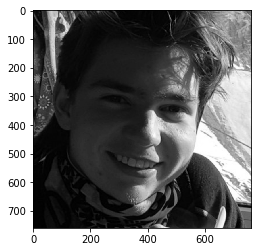

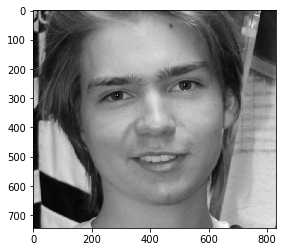

0.00409745


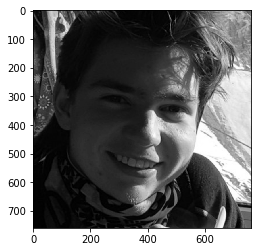

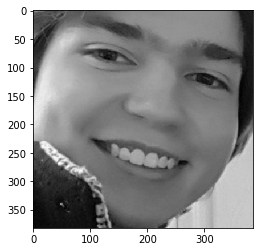

0.00654882


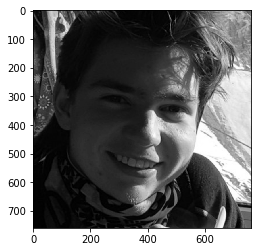

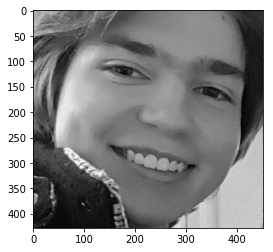

0.00718986


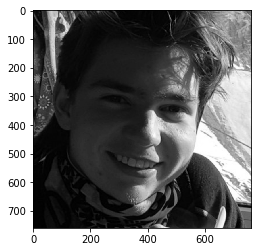

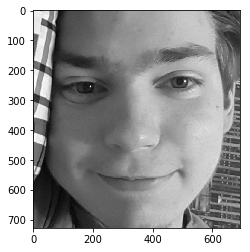

0.00949751


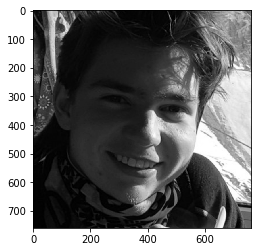

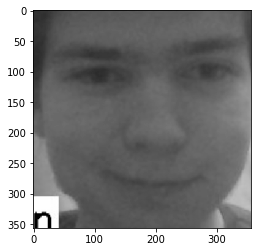

0.00976611


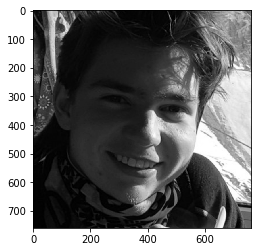

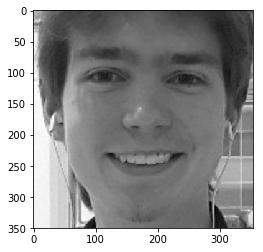

0.00822701


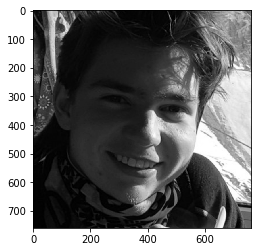

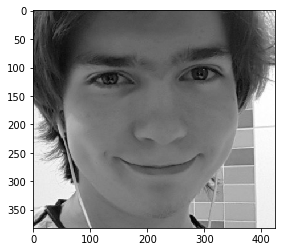

0.00845729


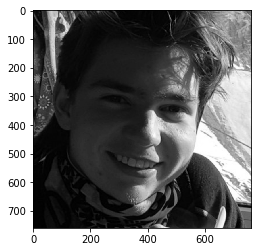

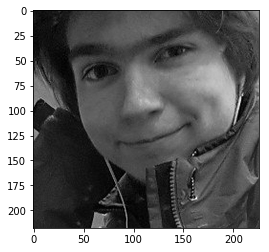

0.00363344


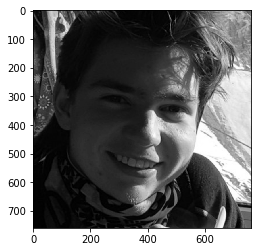

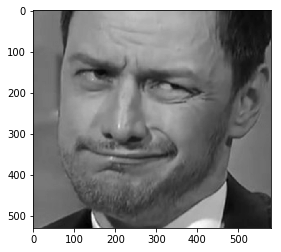

0.0056121


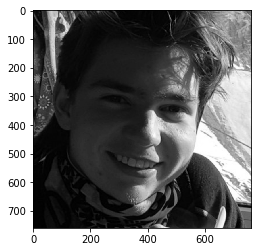

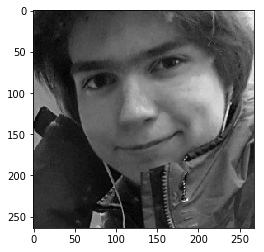

0.0167499
0.00834096


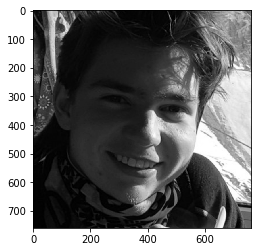

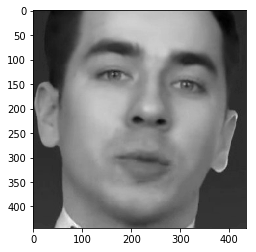

0.00282071


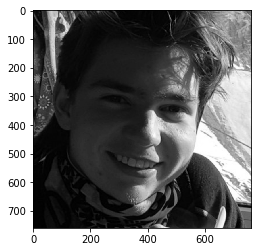

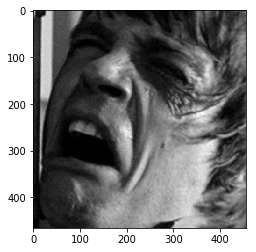

0.0100578


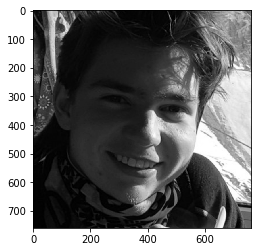

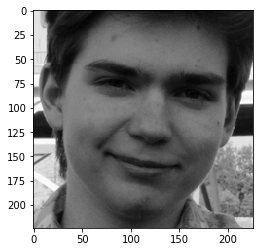

0.00665395


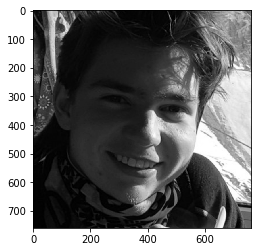

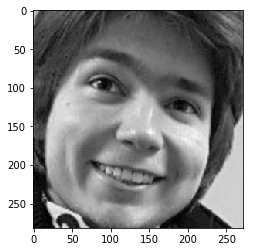

0.00427294


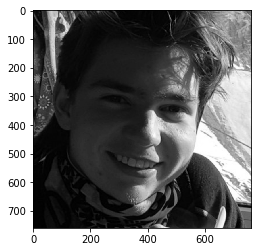

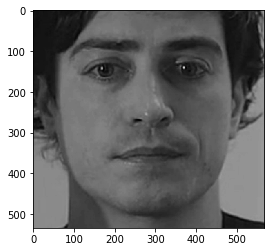

0.012422
0.0113597


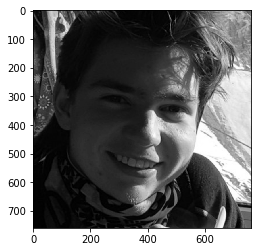

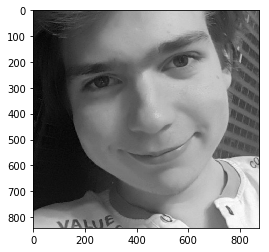

0.00906126


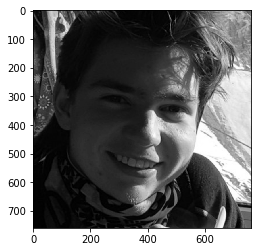

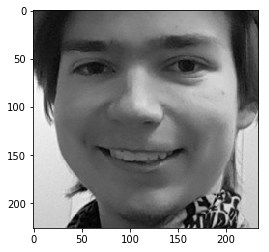

0.00905264


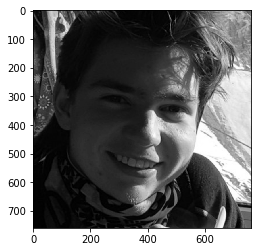

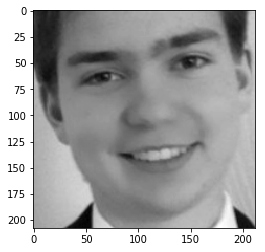

0.00568695


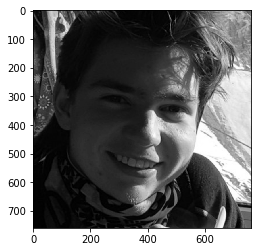

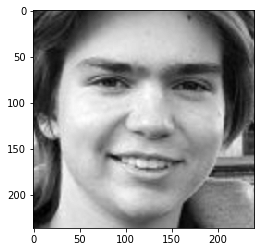

0.00858495


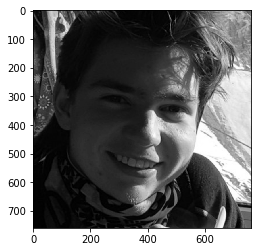

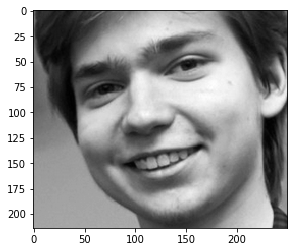

0.0159446
0.017255
0.0
0.0140308
0.00748764


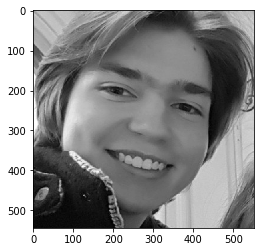

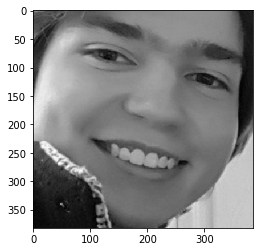

0.0100366


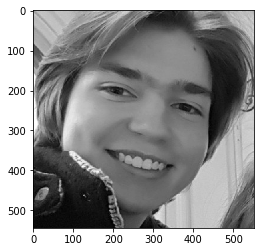

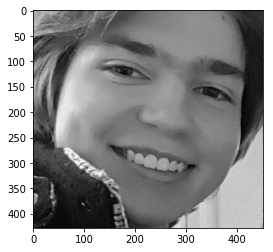

0.0117382


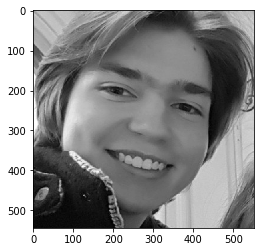

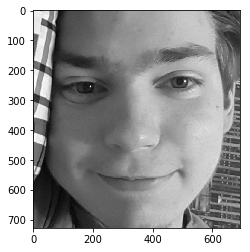

0.0290264
0.0209168
0.00980962


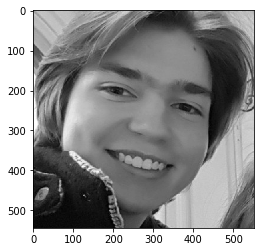

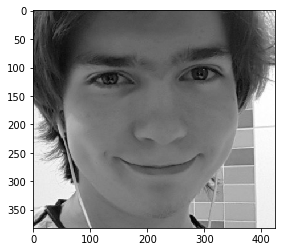

0.0202603
0.0217426
0.0101148


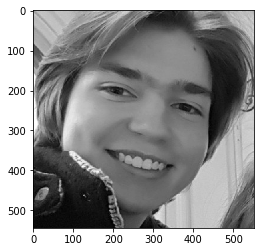

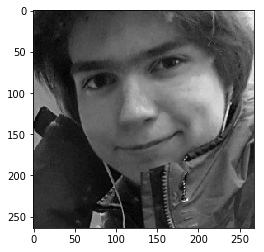

0.0250034
0.019715
0.0148108
0.0281767
0.0149374
0.01759
0.0230064
0.0341322
0.0200935
0.0133535
0.0164324
0.0188415
0.00886147


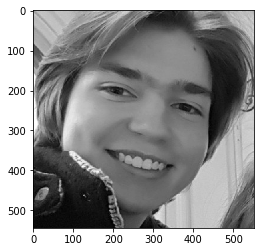

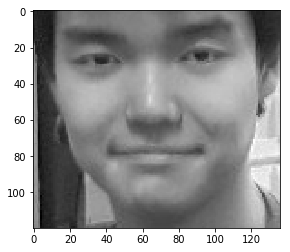

0.00665834


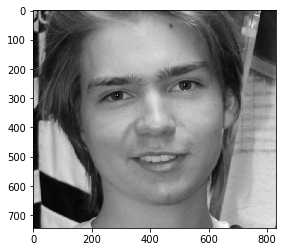

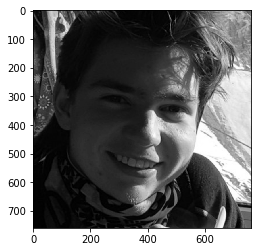

0.0140308
0.0
0.00578843


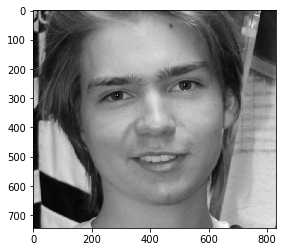

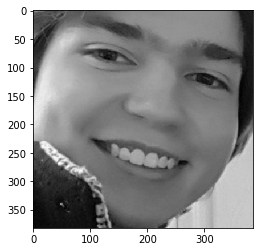

0.00317738


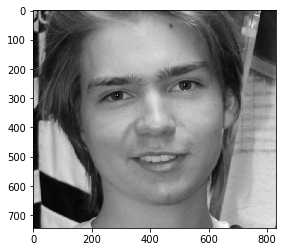

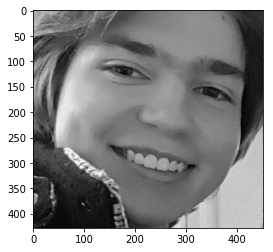

0.00455992


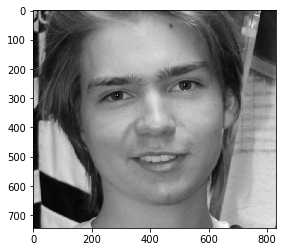

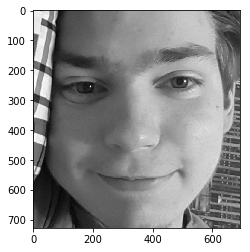

0.0105754


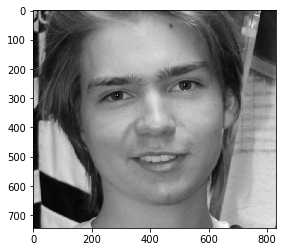

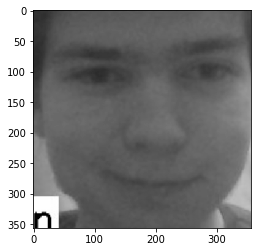

0.00675944


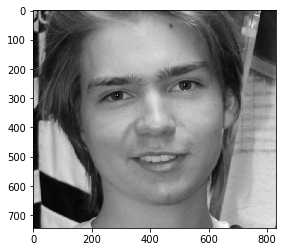

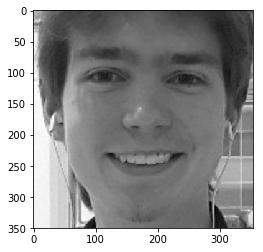

0.00683916


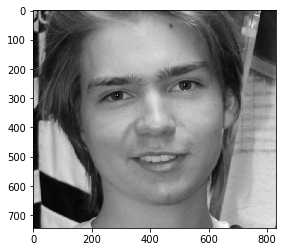

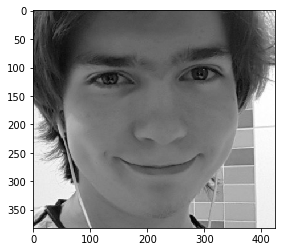

0.00281214


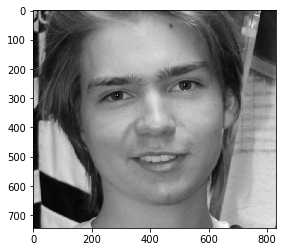

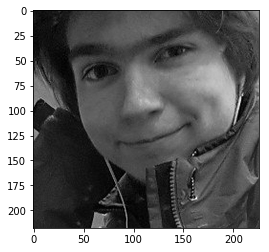

0.00559874


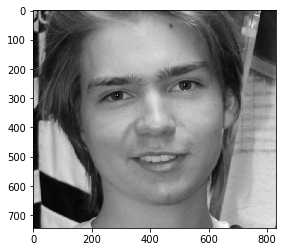

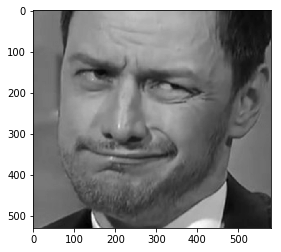

0.0032704


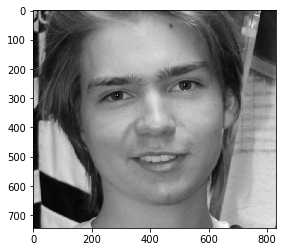

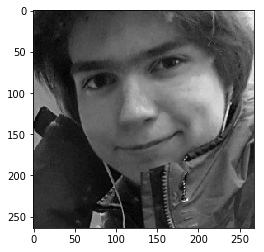

0.0163765
0.00830386


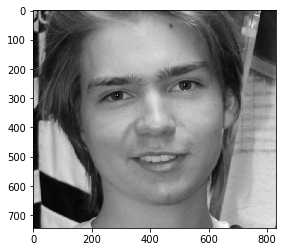

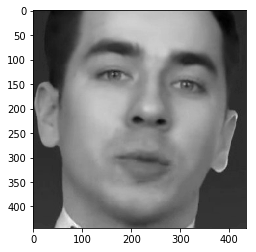

0.00315343


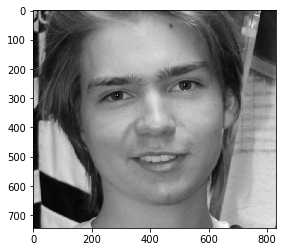

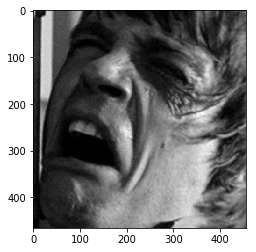

0.010077


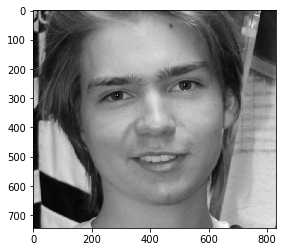

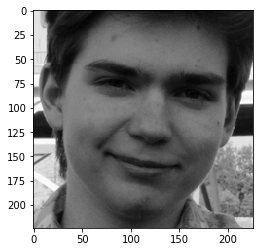

0.00748028


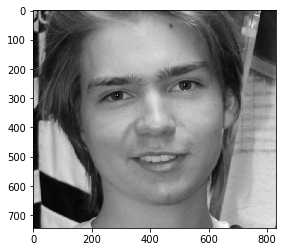

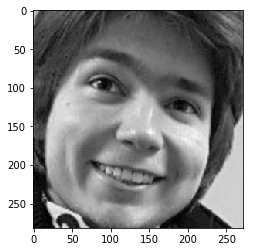

0.00481918


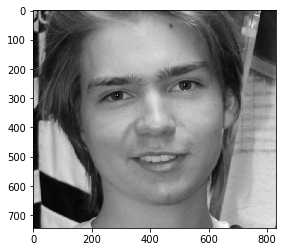

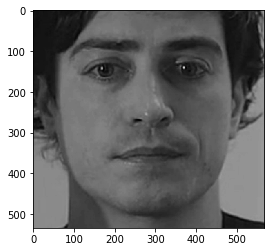

0.00891166


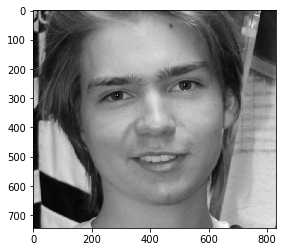

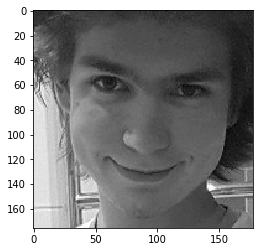

0.0105445


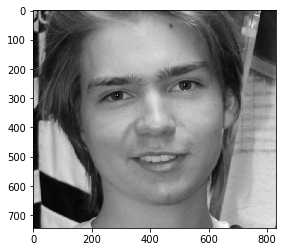

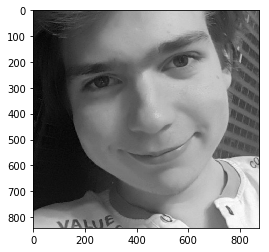

0.00317787


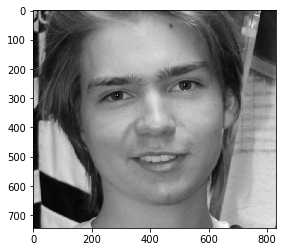

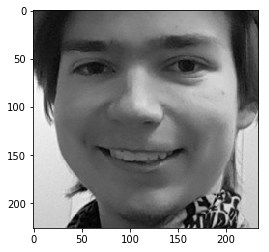

0.00618461


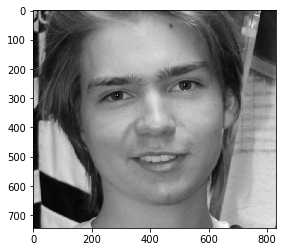

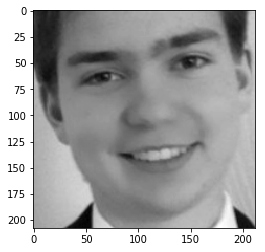

0.00763907


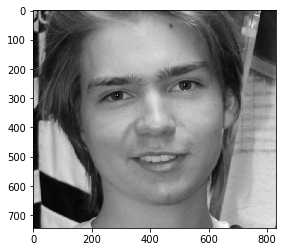

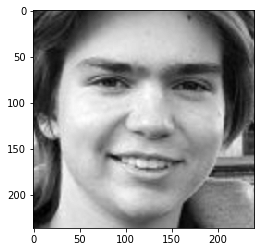

0.00366616


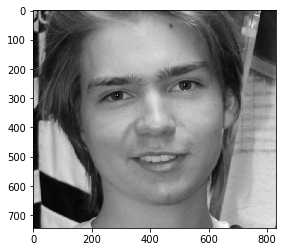

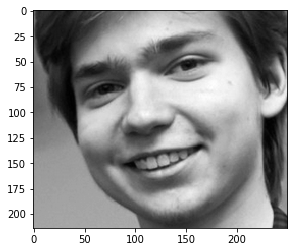

0.0126197
0.00409745


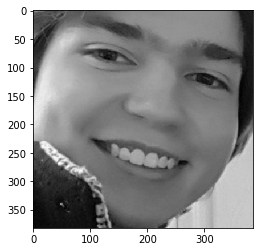

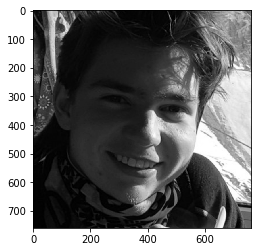

0.00748764


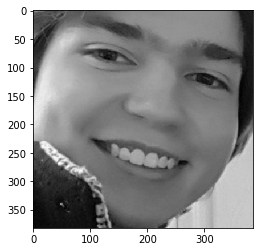

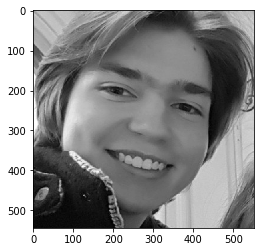

0.00578843


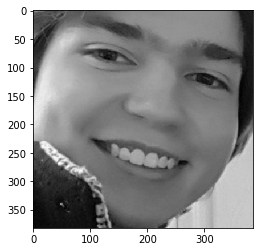

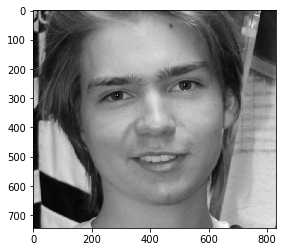

0.0
0.00216355


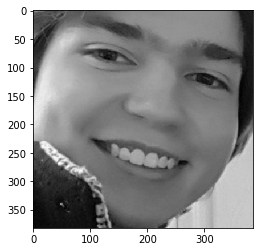

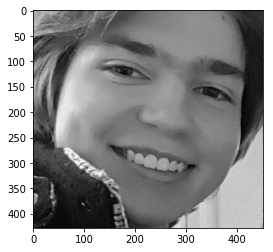

0.00337947


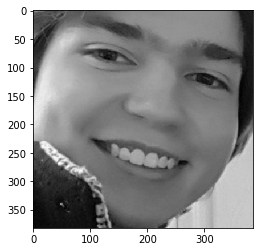

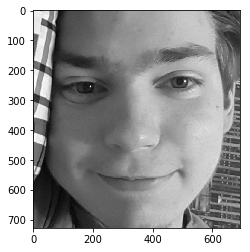

0.0151596
0.00949848


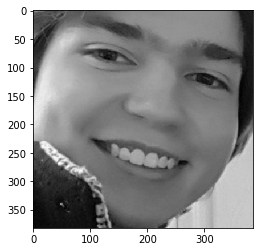

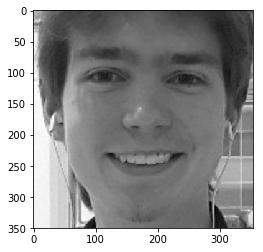

0.00568101


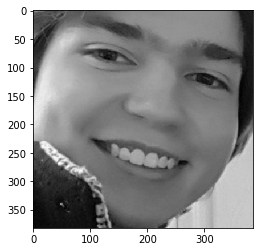

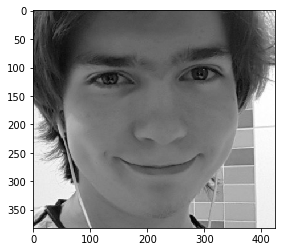

0.00985426


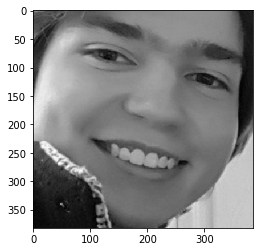

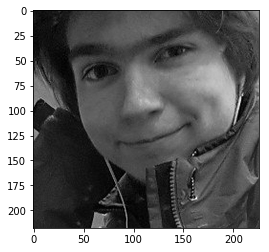

0.0071924


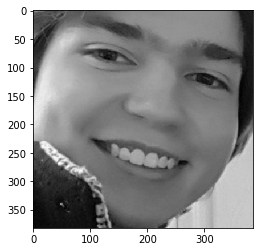

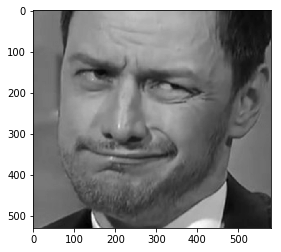

0.00475973


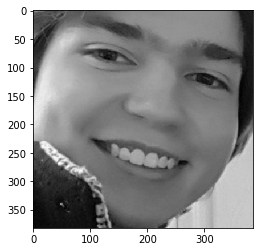

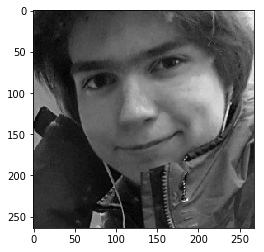

0.0108796


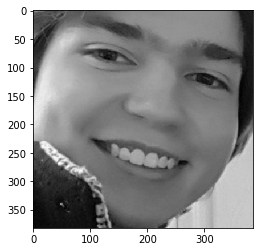

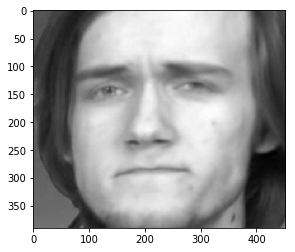

0.00514737


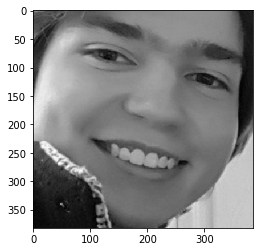

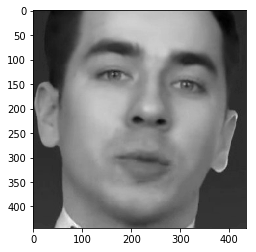

0.00256103


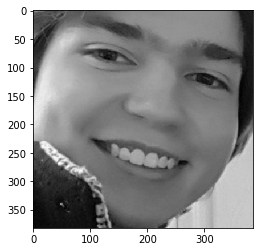

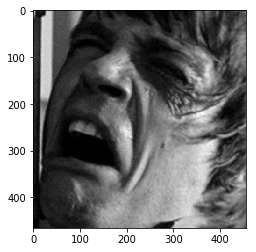

0.0150422
0.00399354


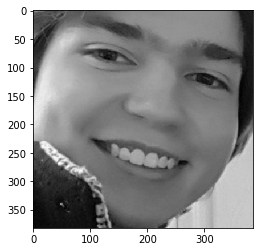

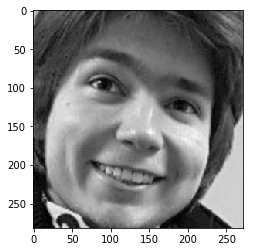

0.00478415


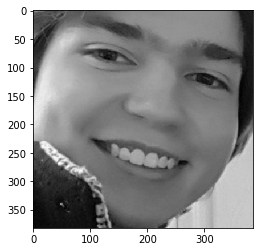

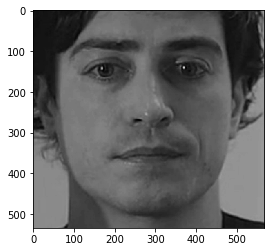

0.0100098


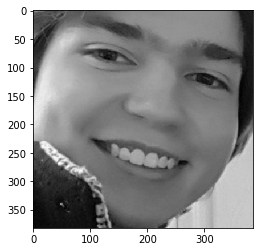

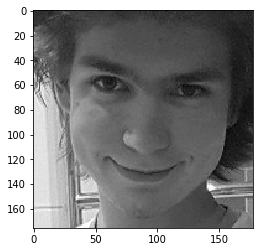

0.0177126
0.00876493


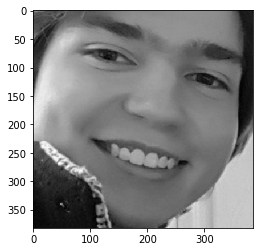

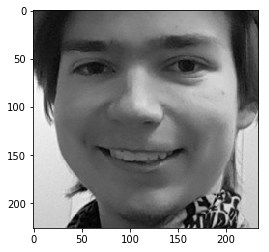

0.00450145


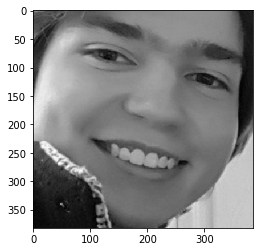

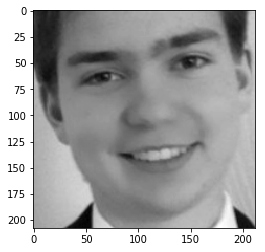

0.00389074


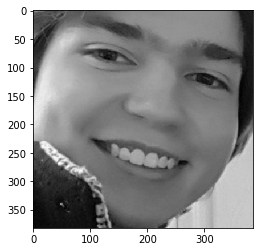

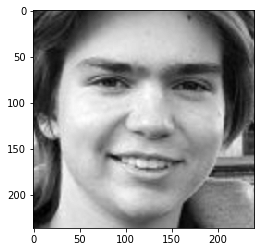

0.00726864


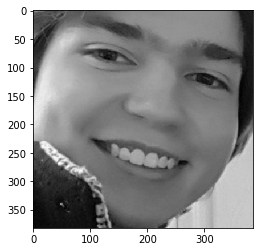

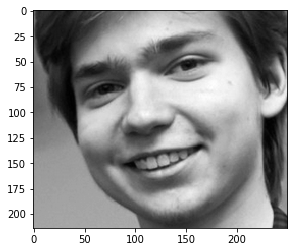

0.0060145


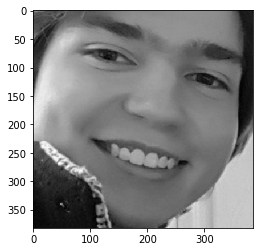

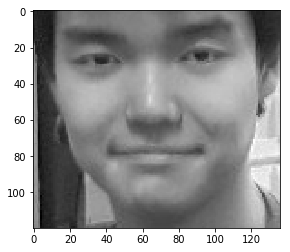

0.00654882


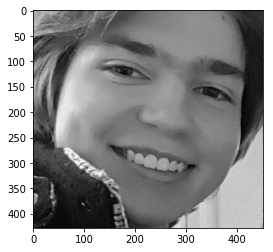

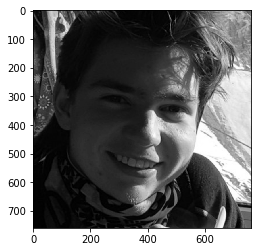

0.0100366


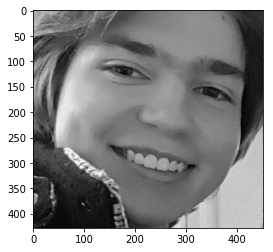

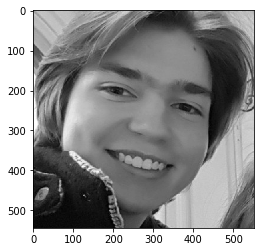

0.00317738


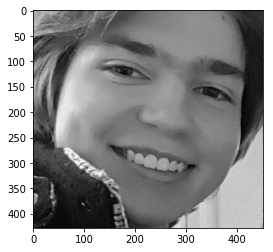

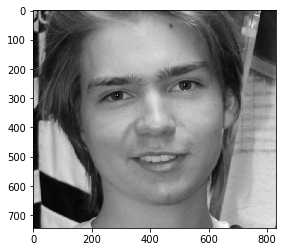

0.00216355


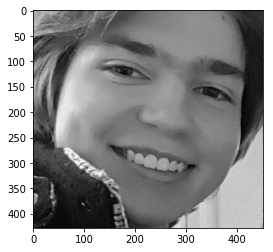

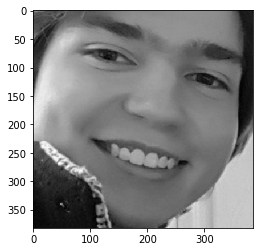

0.0
0.00174461


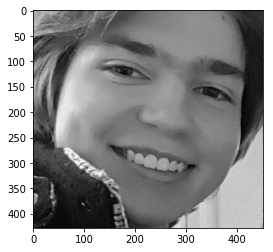

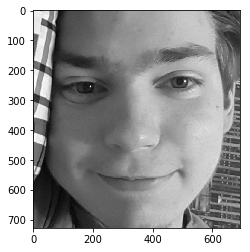

0.0175416
0.010873


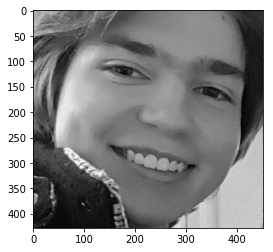

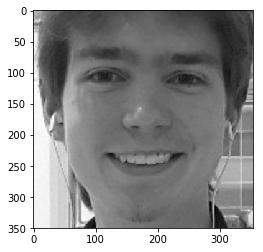

0.00777525


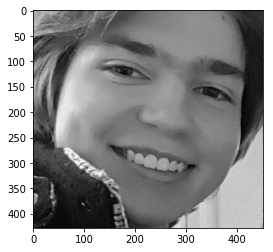

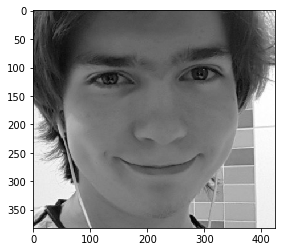

0.00661509


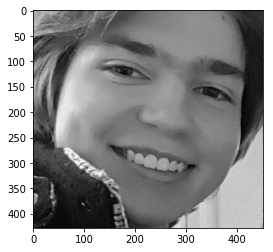

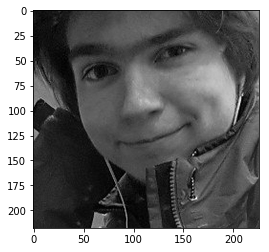

0.00860328


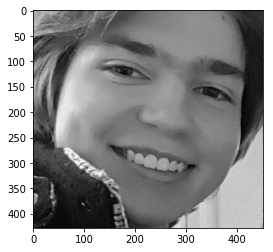

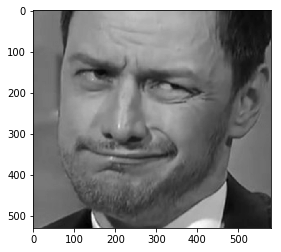

0.00424797


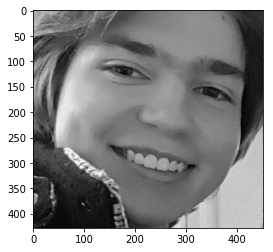

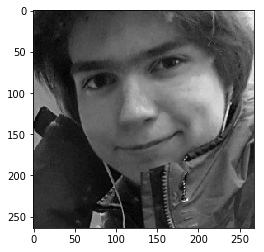

0.00841689


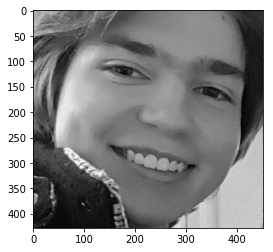

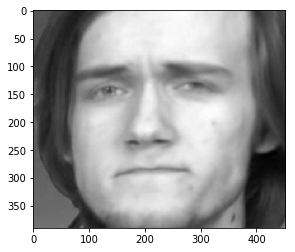

0.00373266


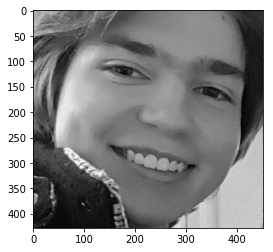

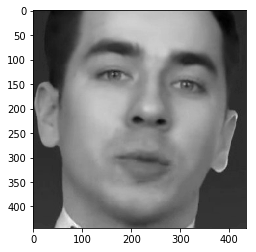

0.00163811


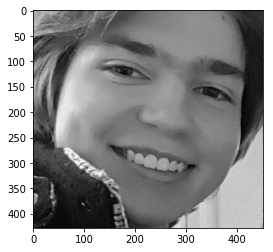

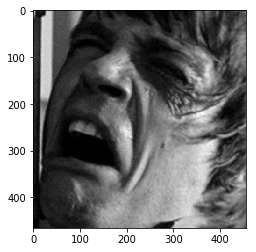

0.017483
0.00590299


KeyboardInterrupt: 

In [7]:
import cv2

maks = [None for _ in range(25)]
vals = [None for _ in range(25)]

for i in range(25):
    maks[i] = cv2.imread('../makph/'+str(i+1)+'m.png')
    maks[i] = cv2.cvtColor(maks[i], cv2.COLOR_BGR2GRAY)
    vals[i] = cv2.resize(maks[i], (img_size, img_size)).reshape(1, img_size, img_size)

for i in range(25):
    for j in range(25):
        pr = test_fn([vals[i]], [vals[i]], [vals[j]])[1][0]
        print(pr)
        if (pr <= 0.007 and pr != 0.0):
            plt.imshow(maks[i], cmap='gray')
            plt.show()
            plt.imshow(maks[j], cmap='gray')
            plt.show()